In [1]:
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

from IPython.display import display

In [2]:
def get_data():
    data = np.loadtxt("iris.txt")
    iris_data = data[50:]
    return iris_data

def get_train_and_test(feature):
    iris_data = get_data()

    positive_data = iris_data[:50, feature]
    positive_data = np.expand_dims(positive_data, axis=2)

    negative_data = iris_data[50:, feature]
    negative_data = np.expand_dims(negative_data, axis=2)

    train_data_positive = positive_data[:25]
    train_data_negative = negative_data[:25]

    test_data_positive = positive_data[25:]
    test_data_negative = negative_data[25:]

    train_data = np.concatenate((train_data_positive, train_data_negative), axis=0)
    test_data = np.concatenate((test_data_positive, test_data_negative), axis=0)

    train_label = [1] * len(train_data_positive) + [-1] * len(train_data_negative)
    test_label = [1] * len(test_data_positive) + [-1] * len(test_data_negative)

    train_label_plot = ['positive'] * len(train_data_positive) + ['negative'] * len(train_data_negative)
    test_label_plot = ['positive'] * len(test_data_positive) + ['negative'] * len(test_data_negative)

    return(train_data, test_data, train_label, test_label, train_data_positive, train_data_negative, test_data_positive, test_data_negative, train_label_plot, test_label_plot)

def cross_validation(svm_type, train_data, test_data, train_label, test_label, c=10, sigma=None, p=None):
    accuracys = []
    for count in range(2):
        if svm_type == 'linear_svm':
            svm = LinearSVM(c=c)
            svm.fit(train_data, train_label)
        elif svm_type == 'rbf_svm':
            if not sigma:
                raise ValueError('sigma must have value.')

            svm = RBFSVM(c=c, sigma=sigma)
            svm.fit(train_data, train_label)
        elif svm_type == 'polynomial_svm':
            if not p:
                raise ValueError('p must be number.')

            svm = PolynomialSVM(c=c, p=p)
            svm.fit(train_data, train_label)
        else:
            raise ValueError('The svm_type Parameter must be "linear_svm", "rbf_svm" or "poly_svm".')

        accuracys.append(svm.evaluate(test_data, test_label))
        
        if count == 1:
            break
        else:
            train_data, test_data = test_data, train_data
            train_label, test_label = test_label, train_label
            
    # part 1 & 2 & 3, step 7: get average accuracy
    return np.array(accuracys).mean()

def plot_binary_class_area_and_2d_data(svm, x, hue_label, x_label='Feature 3', y_label='Feature 4'):
    positive_area, negative_area = svm.get_binary_class_area()

    sns.scatterplot(x=positive_area[:, 0], y=positive_area[:, 1])
    sns.scatterplot(x=negative_area[:, 0], y=negative_area[:, 1])
    sns.scatterplot(x=x[:, 0, 0], y=x[:, 1, 0], hue=hue_label).set(xlabel=x_label, ylabel=y_label)

In [3]:
feature = [2, 3]

train_data, test_data, train_label, test_label, train_data_positive, train_data_negative, test_data_positive, test_data_negative, train_label_plot, test_label_plot = get_train_and_test(feature)

In [4]:
from svm import RBFSVM

gaussian_svm = RBFSVM()
gaussian_svm.fit(train＿data, train_label)

alpha = gaussian_svm.alpha
bias = gaussian_svm.bias

print('alpha:')
for index in range(len(alpha)):
    print('    {}'.format(round(alpha[index][0], 4)))

print('bias:\n    {}'.format(bias[0, 0]))

alpha:
    10.0
    8.9619
    10.0
    0.0
    10.0
    0.0
    10.0
    0.0
    0.0
    0.0
    0.0
    0.0
    0.0
    10.0
    0.0
    0.0
    8.9619
    0.0
    8.9619
    0.0
    10.0
    0.0
    10.0
    0.0
    0.0
    0.0
    10.0
    0.0
    6.5945
    0.0
    0.0
    10.0
    0.0
    0.0
    0.0
    10.0
    10.0
    0.0
    10.0
    0.2912
    0.0
    10.0
    0.0
    0.0
    10.0
    0.0
    10.0
    0.0
    10.0
    0.0
bias:
    0.23916785018128195


In [5]:
accuracy_1 = gaussian_svm.evaluate(test_data, test_label)
print('Accuracy is: {}%'.format(accuracy_1))

Accuracy is: 92.0%


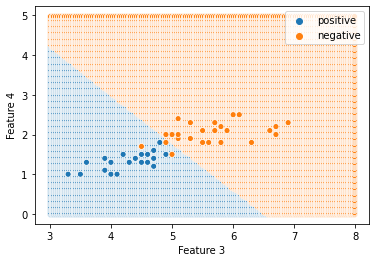

In [6]:
plot_binary_class_area_and_2d_data(gaussian_svm, train_data, train_label_plot)

In [7]:
average_accuracy = cross_validation('rbf_svm', train_data, test_data, train_label, test_label, c=10, sigma=5)

print('Average accuracy is: {}%'.format(average_accuracy))

Average accuracy is: 94.0%


Average accuracy is: 95.0% when sigma is 1
--------------------
Average accuracy is: 77.0% when sigma is 0.5
--------------------
Average accuracy is: 87.0% when sigma is 0.1
--------------------
Average accuracy is: 81.0% when sigma is 0.05
--------------------


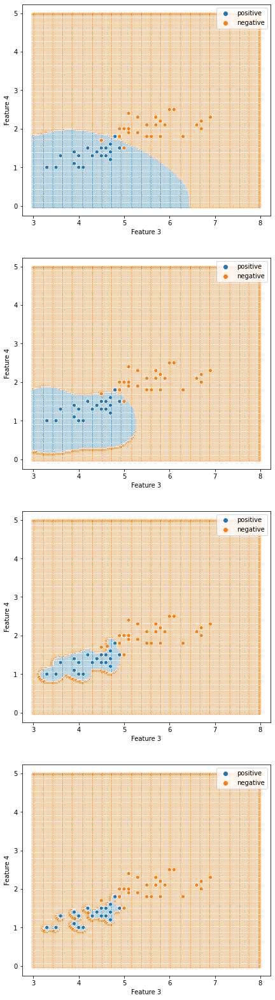

In [10]:
sigma = [1, 0.5, 0.1, 0.05]

plt.figure(figsize=(7, 28))

for index in range(len(sigma)):
    gaussian_svm = RBFSVM(sigma=sigma[index])
    gaussian_svm.fit(train_data, train_label)

    plt.subplot(len(sigma), 1, index + 1)
    plot_binary_class_area_and_2d_data(gaussian_svm, train_data, train_label_plot)

    average_accuracy = cross_validation('rbf_svm', train_data, test_data, train_label, test_label, sigma=sigma[index])
    print('Average accuracy is: {}% when sigma is {}\n{}'.format(average_accuracy, sigma[index], '-' * 20))